<a href="https://colab.research.google.com/github/weisurya/fastai-practical-deep-learning-for-coders/blob/main/02_production.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#hide
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()


     |████████████████████████████████| 727kB 9.2MB/s 
     |████████████████████████████████| 51kB 8.7MB/s 
     |████████████████████████████████| 1.2MB 19.4MB/s 
     |████████████████████████████████| 194kB 49.1MB/s 
     |████████████████████████████████| 61kB 9.9MB/s 
     |████████████████████████████████| 51kB 9.0MB/s 
Mounted at /content/gdrive


In [53]:
!pip install kora
from kora import console
console.start()  # and click link

     |████████████████████████████████| 61kB 5.2MB/s 
Console URL: https://teleconsole.com/s/b44dc21f2dee23c57fdbfa090a58b4f53da51e7c


In [2]:
from fastbook import *
from fastai.vision.widgets import *

In [37]:
key = os.environ.get('AZURE_SEARCH_KEY', 'XXX')

In [16]:
results = search_images_bing(key, 'grizzly bear')
ims = results.attrgot('content_url')
len(ims)

150

In [26]:
results[0]

{'accentColor': '7C644F',
 'contentSize': '178172 B',
 'contentUrl': 'https://www.pbs.org/wnet/nature/files/2018/07/Bear133-1280x720.jpg',
 'datePublished': '2020-11-12T22:05:00.0000000Z',
 'encodingFormat': 'jpeg',
 'height': 720,
 'hostPageDiscoveredDate': '2019-06-15T00:00:00.0000000Z',
 'hostPageDisplayUrl': 'https://www.pbs.org/wnet/nature/blog/legacy-big-boy-grizzly-bear',
 'hostPageDomainFriendlyName': 'PBS',
 'hostPageFavIconUrl': 'https://www.bing.com/th?id=ODF.6ks36T98eL13adVA4nwLZA&pid=Api',
 'hostPageUrl': 'https://www.pbs.org/wnet/nature/blog/legacy-big-boy-grizzly-bear/',
 'imageId': 'B73F5D5B4D63B4C008E40573B6740D42A6650FCF',
 'imageInsightsToken': 'ccid_kdahtkrc*cp_BEE342EC5665725949123133ADA343D7*mid_B73F5D5B4D63B4C008E40573B6740D42A6650FCF*simid_608036781369133554*thid_OIP.kdahtkrcG4jfR9iaN68-egHaEK',
 'insightsMetadata': {'availableSizesCount': 10,
  'pagesIncludingCount': 19,
  'recipeSourcesCount': 0},
 'isFamilyFriendly': True,
 'name': 'The Legacy of Big Boy the 

In [29]:
dest = 'images/grizzly.jpg'
download_url(results[0]['contentUrl'], dest)

im = Image.open(dest)
im.to_thumb(128, 128)

FileNotFoundError: ignored

In [54]:
bear_types = ['grizzly', 'black', 'teddy']
path = Path('bears')
print(path.exists())

True


In [55]:
if not path.exists():
    path.mkdir()

for o in bear_types:
    dest = (path/o)
    dest.mkdir(exist_ok=True)
    results = search_images_bing(key, f'{o} bear')
    download_images(dest, urls=results.attrgot('contentUrl'))

150
150
150


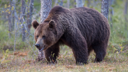

In [60]:
fns = get_image_files(path)
fns

im = Image.open(fns[0])
im.to_thumb(128, 128)

In [57]:
failed = verify_images(fns)
failed

(#9) [Path('bears/grizzly/00000012.jpg'),Path('bears/grizzly/00000083.jpg'),Path('bears/black/00000098.jpg'),Path('bears/black/00000085.jpg'),Path('bears/black/00000027.jpg'),Path('bears/teddy/00000045.jpg'),Path('bears/teddy/00000068.jpg'),Path('bears/teddy/00000064.jpg'),Path('bears/teddy/00000115.jpg')]

In [61]:
failed.map(Path.unlink)

(#9) [None,None,None,None,None,None,None,None,None]

In [64]:
??verify_images

In [65]:
doc(verify_images)

In [66]:
bears = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128),
)

In [67]:
doc(DataBlock)

In [68]:
dls = bears.dataloaders(path)

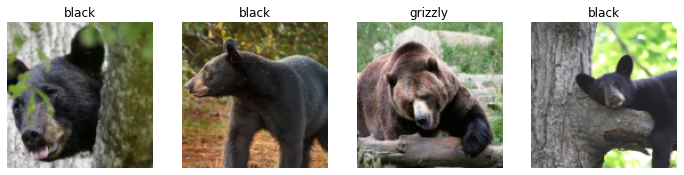

In [69]:
dls.valid.show_batch(max_n=4, nrows=1)

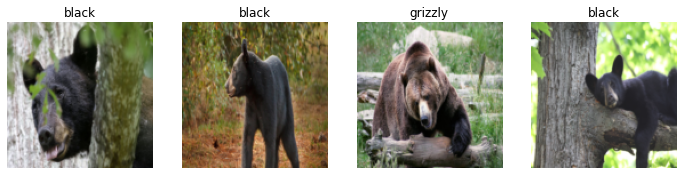

In [70]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Squish))

dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

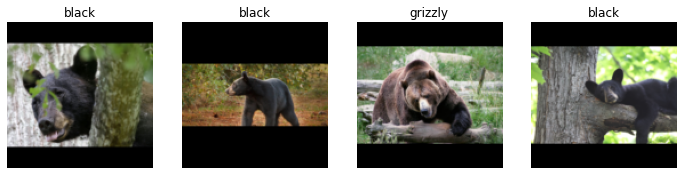

In [71]:
bears = bears.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))

dls = bears.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

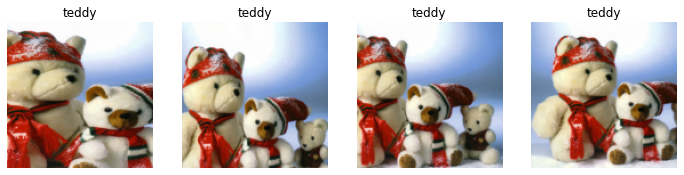

In [72]:
bears = bears.new(item_tfms=RandomResizedCrop(128, min_scale=.3))

dls = bears.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

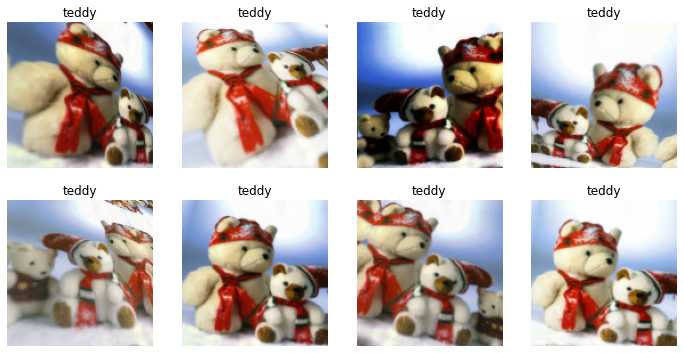

In [73]:
bears = bears.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))

dls = bears.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

In [74]:
bears = bears.new(
    item_tfms=RandomResizedCrop(223, min_scale=.5),
    batch_tfms=aug_transforms()
)

dls = bears.dataloaders(path)

In [76]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)

learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.776454,0.385783,0.192308,00:14


epoch,train_loss,valid_loss,error_rate,time
0,0.208409,0.431795,0.153846,00:14
1,0.142760,0.383259,0.128205,00:14
2,0.140728,0.350346,0.115385,00:13
3,0.109248,0.422290,0.141026,00:14


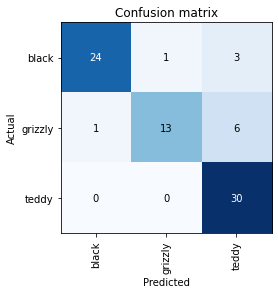

In [77]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

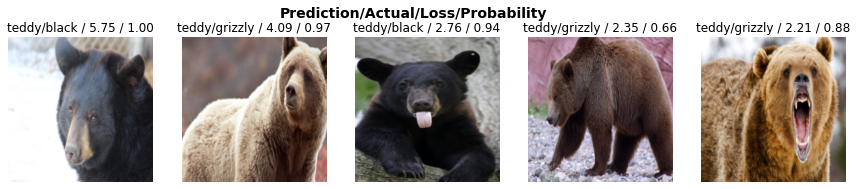

In [80]:
interp.plot_top_losses(5, nrows=1)

In [81]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [82]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

for idx, cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [83]:
learn.export()

In [84]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [85]:
learn_inf = load_learner(path/'export.pkl')

In [88]:
learn_inf.predict(fns[0])

('grizzly', tensor(1), tensor([2.1451e-03, 9.9777e-01, 8.1524e-05]))

In [89]:
learn_inf.dls.vocab

['black', 'grizzly', 'teddy']

In [90]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [91]:
img = PILImage.create(btn_upload.data[-1])

In [92]:
out_pl = widgets.Output()
out_pl.clear_output()

with out_pl: display(img.to_thumb(128, 128))
out_pl

Output()

In [93]:
pred, pred_idx, probs = learn_inf.predict(img)

In [95]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: grizzly; Probability: 0.6725')

In [96]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [109]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])

    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128, 128))

    pred, pred_idx, probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [110]:
btn_upload = widgets.FileUpload()

In [111]:
VBox([
      widgets.Label('Select your bear!'),
      btn_upload,
      btn_run,
      out_pl,
      lbl_pred,
])

In [113]:
!pip install voila
!jupyter serverextension enable --sys-prefix voila

Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
Error loading server extension voila
      X is voila importable?
